In [40]:
# ----------------------------------------------------------------------------
#
# TITLE - potential_fitting.ipynb
# AUTHOR - James Lane
# PROJECT - AST 1501
#
# ----------------------------------------------------------------------------
#
# Docstrings and metadata:
'''Fit the Kuijken & Tremaine model to the MWPotential2014 + triaxial halo model.
'''

__author__ = "James Lane"

In [41]:
### Imports

## Basic
import numpy as np
import sys, os, pdb

## Plotting
from matplotlib import pyplot as plt

## galpy
from galpy import potential

## Astropy
import astropy.units as apu

## Fitting
from scipy.optimize import curve_fit

## Project specific
sys.path.append('../../src/')
import ast1501.potential

In [42]:
# Matplotlib for notebooks
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Meta

## Future work
- 2D fitting doesn't work right now since adding the free parameter offset for the Kuijken model.

## Information
- Kuijken & Tremaine model: https://ui.adsabs.harvard.edu/#abs/1994ApJ...421..178K/abstract

# Define functions

In [43]:
def kuijken_model(x,vc,alpha,psi0,p,D):
    
    if alpha != 0:
        axi_component = ( vc**2 / ( 2 * alpha ) ) * ( x[0] / 8 )**( 2 * alpha )
    else:
        axi_component = ( vc**2 ) * np.log( x[0] )
    ##ie
    
    nonaxi_component = ( psi0*( x[0] / 8 )**(p) ) * ( np.cos( 2*( x[1] ) ) )
    
    return axi_component + nonaxi_component + D
#def

# Make the data to fit
Make MWPotential2014 and replace the normal halo with the triaxial halo

In [173]:
# First declare the data space. Fit a grid from 5-15 kpc in radius and -pi to pi in azimuth
R_limits = [5,15]
phi_limits = [-np.pi,np.pi]
R_range = np.linspace( R_limits[0], R_limits[1], 100 )
phi_range = np.linspace( phi_limits[0], phi_limits[1], 100 )
R_mesh, phi_mesh = np.meshgrid( R_range, phi_range )
mesh_size = R_mesh.shape

# Make into a 2D array that can be fed into the function
Rs = R_mesh.flatten()
phis = phi_mesh.flatten()
xdata = np.vstack((Rs,phis))

In [174]:
# Make the galpy data
mwpot_trihalo = ast1501.potential.make_MWPotential2014_triaxialNFW(halo_b=1.1)

pot = np.zeros_like(Rs)
for i in range( len(pot) ):
    pot[i] = potential.evaluatePotentials( mwpot_trihalo, R=Rs[i]/8, z=0, phi=phis[i] ).value
###i

pot_inf = potential.evaluatePotentials( mwpot_trihalo, R=100000, z=0, phi=0 ).value
# pot -= pot_inf

# Example fit

In [175]:
# Now fit
popt, pcov = curve_fit(kuijken_model, xdata, pot, p0=[220,-1.5,1000,-0.5,1.3*220*220], maxfev=30000 )

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 30000.

In [176]:
variables = ['vc','alpha','psi0','p','D']
for i in range(len(popt)):
    print( variables[i] + ': ' + str(popt[i]) )
###i

print('\n\n')
print(pcov)

vc: -0.07255156661059031
alpha: 0.001493512806993951
psi0: 0.40920890719566627
p: -0.10761896836206832
D: 0.6302341017409224



[[ 7.62722162e-07 -3.75355392e-08 -1.88630335e-12  9.59755832e-13
  -3.56399856e-06]
 [-3.75355392e-08  1.87677694e-09  8.01787562e-14 -4.09101350e-14
   1.72194249e-07]
 [-1.88630870e-12  8.01790217e-14  4.22826258e-04 -2.09981774e-04
  -2.05575877e-04]
 [ 9.59758478e-13 -4.09102660e-14 -2.09981774e-04  1.04990887e-04
   1.01356584e-04]
 [-3.56399856e-06  1.72194249e-07 -2.05575877e-04  1.01356584e-04
   1.17809850e-04]]


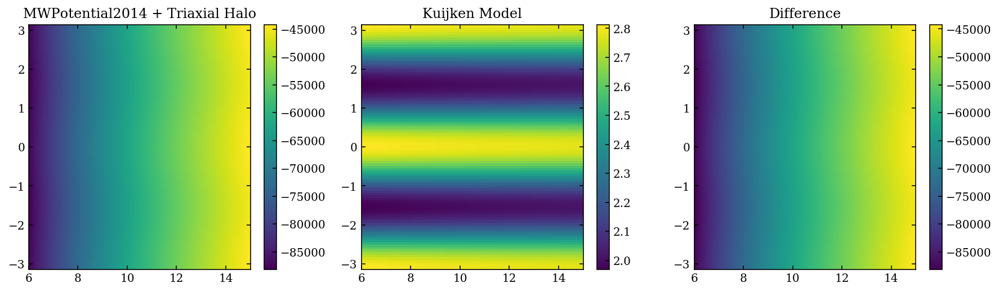

In [177]:
fig = plt.figure( figsize=(15,4) )

plt.subplot(1, 3, 1)
plt.title("MWPotential2014 + Triaxial Halo")
plt.pcolormesh(R_mesh, phi_mesh, pot.reshape(mesh_size) )
plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
plt.colorbar()

plt.subplot(1, 3, 2)
plt.title("Kuijken Model")
plt.pcolormesh( R_mesh, phi_mesh, kuijken_model(xdata, *popt).reshape(mesh_size) )
plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
plt.colorbar()

plt.subplot(1, 3, 3)
plt.title("Difference")
plt.pcolormesh( R_mesh, phi_mesh, pot.reshape(mesh_size) - kuijken_model(xdata, *popt).reshape(mesh_size) )
plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
plt.colorbar()

pass;

# Fit a range of b

In [178]:
b_values = np.linspace( 0.7, 1.3, num=14, endpoint=True )
n_bs = len(b_values)
n_variables = 5
variable_storage = np.zeros( ( n_bs, n_variables ) )
uncertainty_storage = np.zeros( ( n_bs, n_variables ) )
variable_names = [r'$v_{c} [km/s]$',r'$\alpha$',r'$\psi_{0}$ [km$^{2}$/s$^{2}$]',r'$p$',
                  r'D [km$^{2}$/s$^{2}$]']

[ 2.13268755e+02 -1.46763483e-01 -1.05973372e+03  2.87026781e-01
  1.11421138e+05]
[ 2.14460326e+02 -1.40352012e-01 -9.11522643e+02  2.99201665e-01
  1.16536962e+05]
[ 2.15573437e+02 -1.34347737e-01 -7.55997051e+02  3.10669883e-01
  1.21960819e+05]
[ 2.16615019e+02 -1.28714940e-01 -5.94614206e+02  3.21495650e-01
  1.27691661e+05]
[ 2.17591250e+02 -1.23421848e-01 -4.28615888e+02  3.31735369e-01
  1.33728967e+05]
[ 2.18507654e+02 -1.18440119e-01 -2.59060811e+02  3.41442124e-01
  1.40072724e+05]
[ 2.19369174e+02 -1.13744410e-01 -8.68520926e+01  3.50696566e-01
  1.46723386e+05]
[ 2.20180248e+02 -1.09311962e-01  8.72396043e+01  3.59279837e-01
  1.53681923e+05]
[ 2.20944869e+02 -1.05122333e-01  2.62556618e+02  3.67656292e-01
  1.60949719e+05]
[ 2.21666636e+02 -1.01157096e-01  4.38537876e+02  3.75600219e-01
  1.68528601e+05]
[ 2.22348802e+02 -9.73995860e-02  6.14705114e+02  3.83175954e-01
  1.76420847e+05]
[ 2.22994311e+02 -9.38347174e-02  7.90651016e+02  3.90413142e-01
  1.84629156e+05]
[ 2.

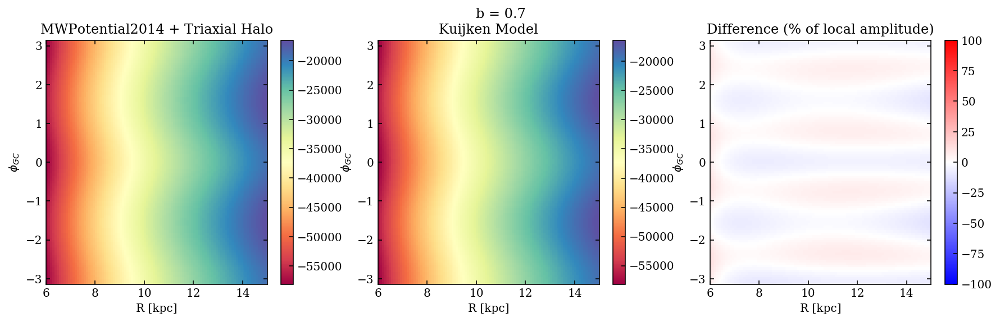

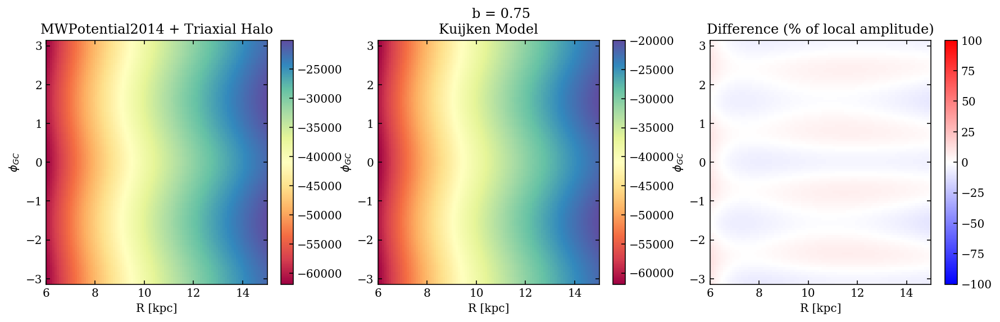

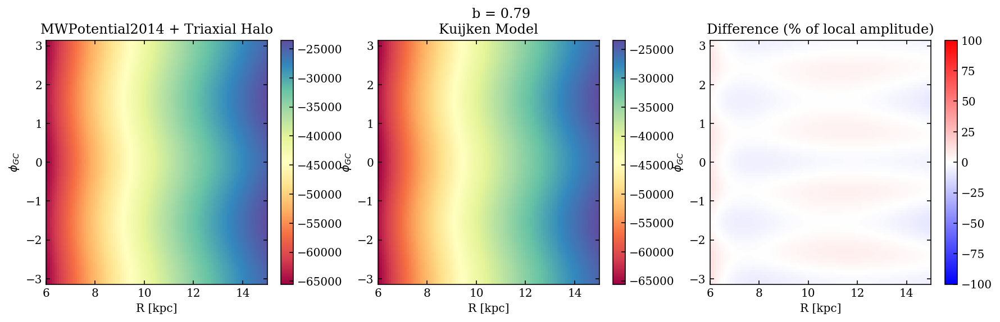

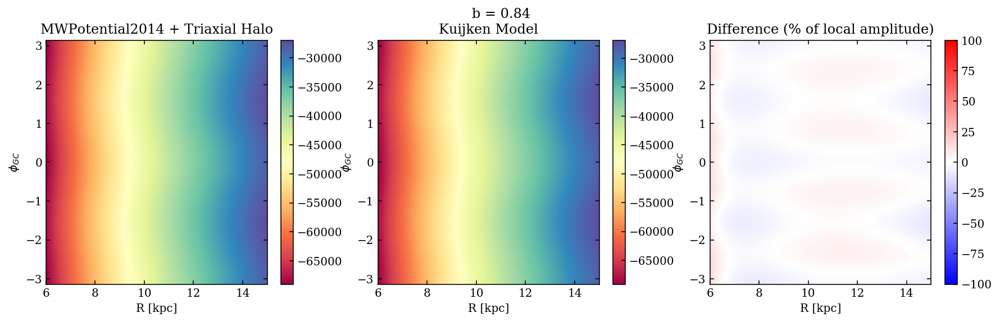

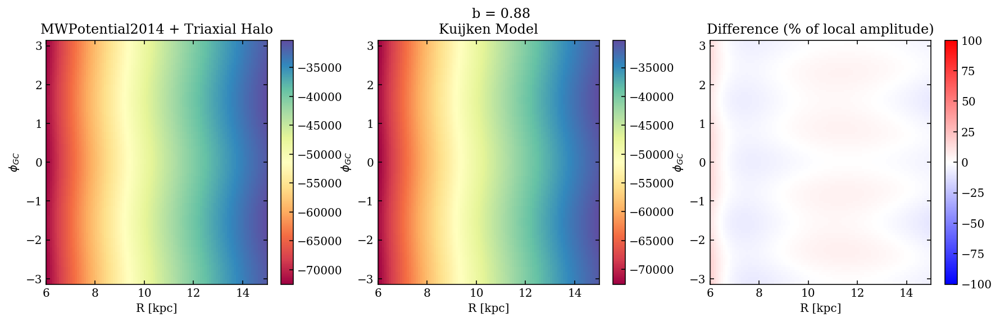

...

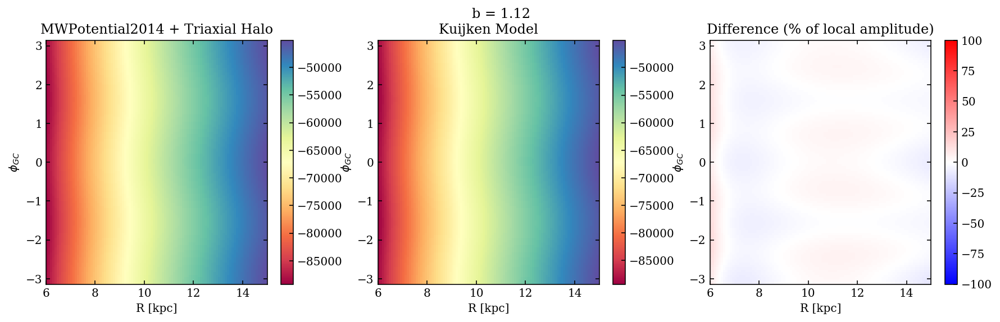

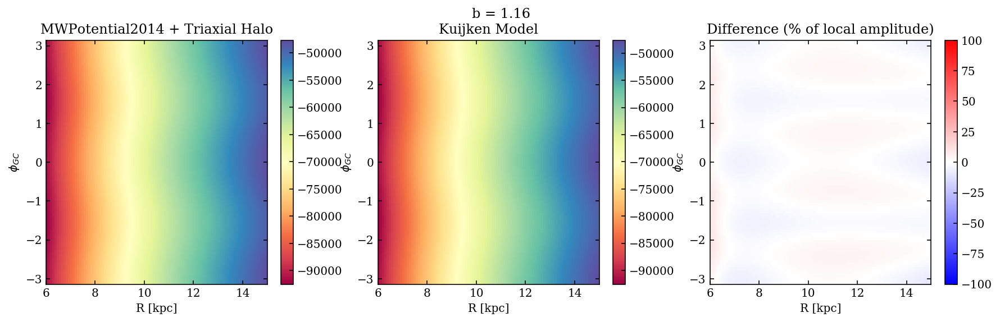

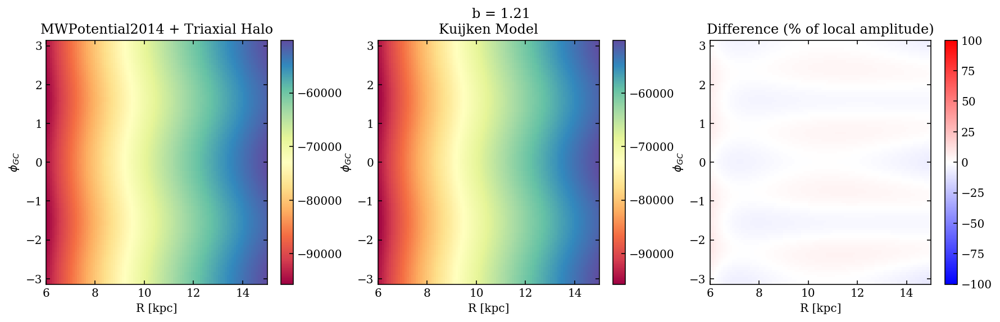

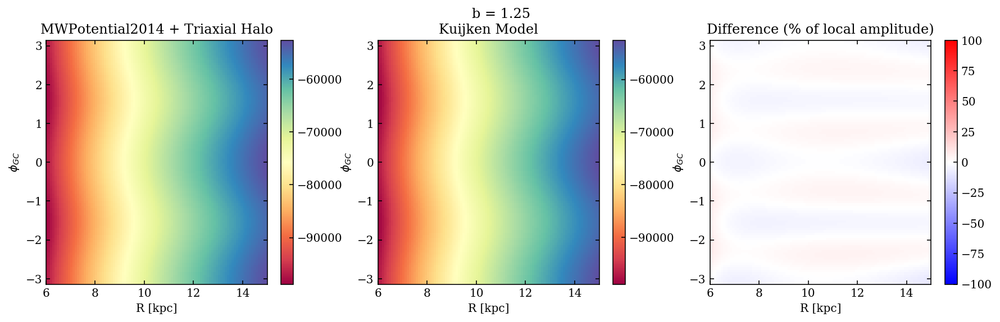

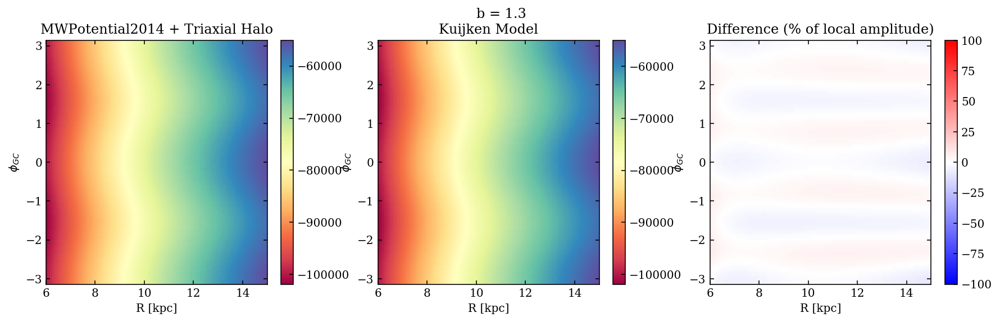

In [179]:
for i in range( n_bs ):
    
    # Make the galpy data
    mwpot_trihalo = ast1501.potential.make_MWPotential2014_triaxialNFW(halo_b=b_values[i])
    pot = np.zeros_like(Rs)
    for j in range( len(pot) ):
        pot[j] = potential.evaluatePotentials( mwpot_trihalo, R=Rs[j]/8, z=0, phi=phis[j] ).value
    ###i
    pot_inf = potential.evaluatePotentials( mwpot_trihalo, R=100000, z=0, phi=0 ).value
    # pot -= pot_inf
    
    # Now fit
    popt, pcov = curve_fit(kuijken_model, xdata, pot, p0=[220,-0.1,0,0.4,220*220*1.3] )
    
    # Store the output
    print(popt)
    variable_storage[i,:] = popt
    uncertainty_storage[i,:] = np.sqrt(np.diag(pcov))
    
    # Now plot
    fig = plt.figure( figsize=(15,4) )

    plt.subplot(1, 3, 1)
    plt.title("MWPotential2014 + Triaxial Halo")
    plt.pcolormesh(R_mesh, phi_mesh, pot.reshape(mesh_size), cmap='Spectral')
    plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
    plt.xlabel('R [kpc]')
    plt.ylabel(r'$\phi_{GC}$')
    plt.colorbar()

    plt.subplot(1, 3, 2)
    plt.title("Kuijken Model")
    plt.pcolormesh( R_mesh, phi_mesh, kuijken_model(xdata, *popt).reshape(mesh_size), cmap='Spectral' )
    plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
    plt.xlabel('R [kpc]')
    plt.ylabel(r'$\phi_{GC}$')
    plt.colorbar()

    plt.subplot(1, 3, 3)
    plt.title("Difference (% of local amplitude)")
    pot_Ravg_sub = pot.reshape(mesh_size) - np.mean( pot.reshape(mesh_size), 0 ) # Average of each R is subtracted
    pot_Ravg_sub_max = np.amax( pot_Ravg_sub, axis=0 )
    pot_Ravg_sub_max_grid = np.repeat( pot_Ravg_sub_max[:, np.newaxis], pot_Ravg_sub_max.shape[0], axis=1)
    plt.pcolormesh( R_mesh, phi_mesh, 
                   100*np.divide(pot.reshape(mesh_size) - kuijken_model(xdata, *popt).reshape(mesh_size),
                                 pot_Ravg_sub_max_grid), cmap='bwr', vmin=-100, vmax=100 
                  )
    plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
    plt.xlabel('R [kpc]')
    plt.ylabel(r'$\phi_{GC}$')
    plt.colorbar()
    
    plt.suptitle('b = '+str(round(b_values[i],2)) )

    pass;
###i

## Plot the parameter values as a function of b/a

Fit a power law of the form:

$
f(b) = A(b)^{k} + d
$

or 

$
f(b) = A(b-c)^{k} + d
$

[  6.99564667 -32.68189569  61.94138223 183.52912848]


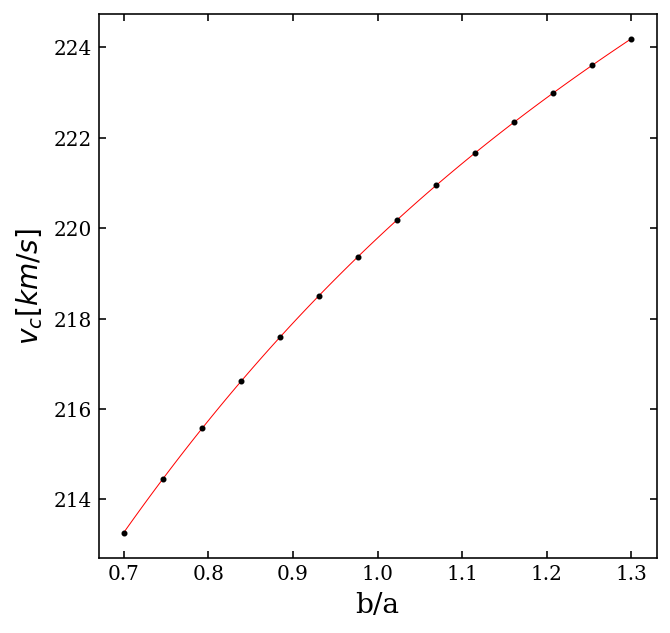

[ 0.03586459 -0.1686493   0.32569561 -0.30438946]


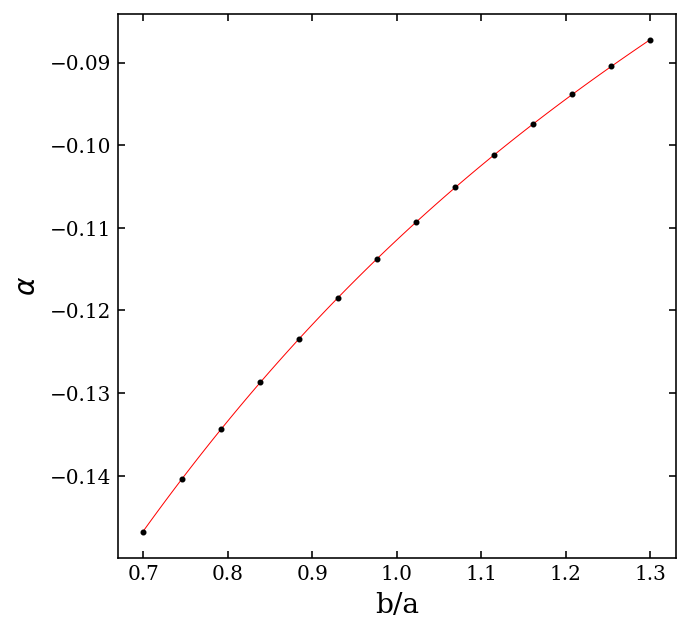

[-1186.36923367  4005.35407313  -677.4008646  -2142.46889438]


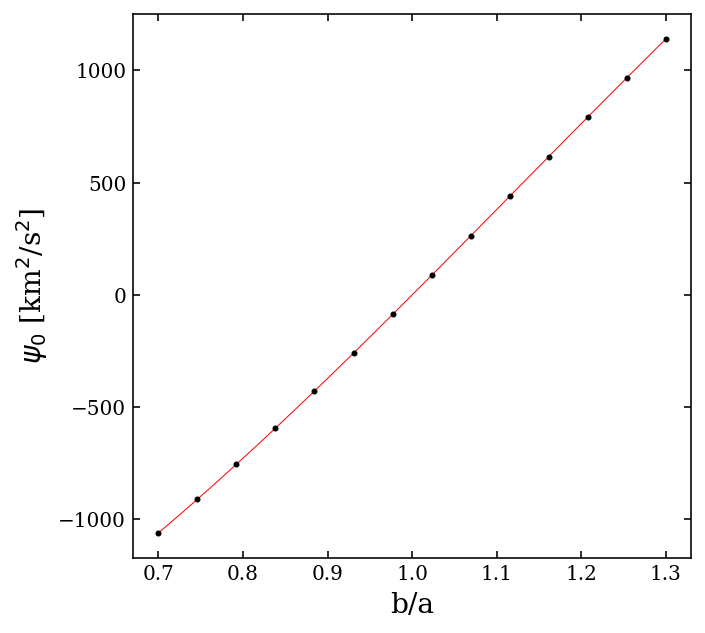

[ 0.0635495  -0.2966242   0.59179528 -0.00364539]


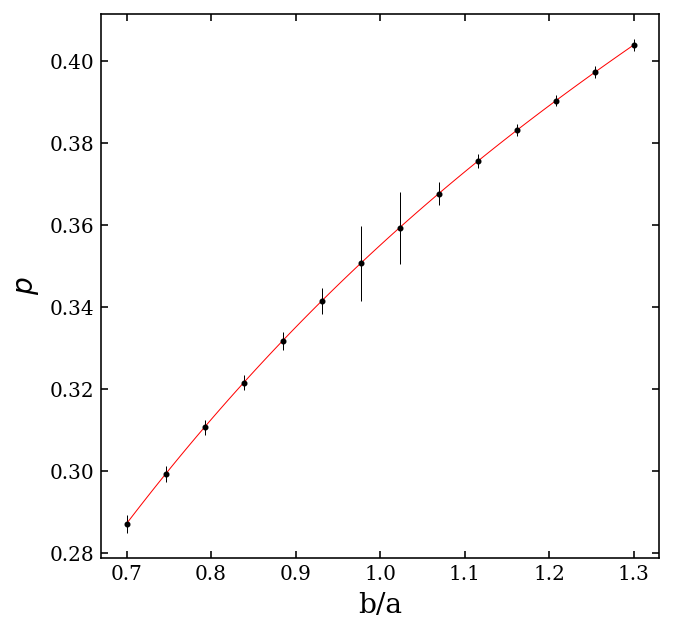

[ 2311.55477632 65830.86700305 12171.8034442  69846.20118183]


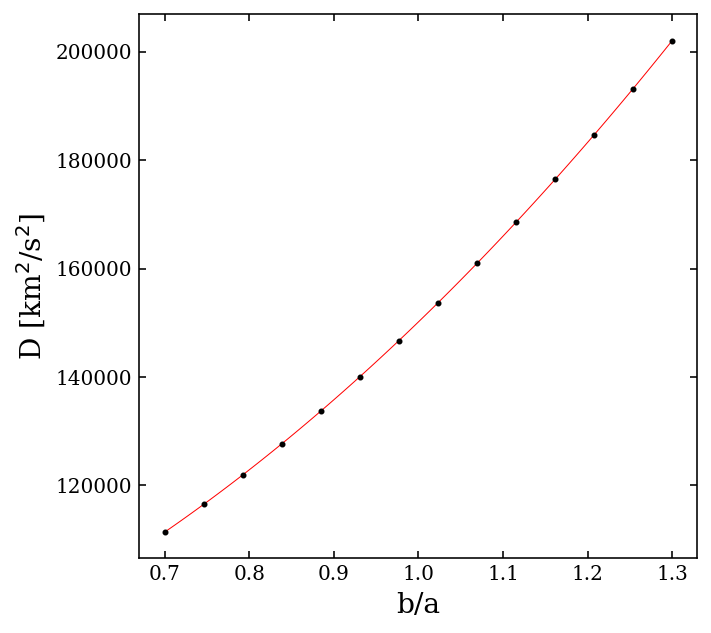

In [180]:
# Now plot the variables

def power_law(x,A,k,d):
    return A*np.power(x,k)+d
#def

def third_order_poly(x,A,B,C,D):
    return A*np.power(x,3)+B*np.power(x,2)+C*x+D
#def

# def offset_power_law(x,A,c,k,d):
#     return A*np.power(x+c,k)+d
# #def

# def offset_power_law_force(x,A,k,d):
#     return A*np.power(x-0.99,k)+d

for i in range( n_variables ):
    
    fig = plt.figure( figsize=(5,5) )
    ax = fig.add_subplot(111)
    
    ax.errorbar( b_values, variable_storage[:,i], fmt='o', yerr=uncertainty_storage[:,i], markersize=2,
                 color='Black', elinewidth=0.5 )
    ax.set_xlabel( 'b/a', fontsize=14 )
    ax.set_ylabel( variable_names[i], fontsize=14 )
    
    popt,pcov = curve_fit( third_order_poly, b_values, variable_storage[:,i], maxfev=10000 )
    fake_x = np.linspace(0.7,1.3,num=100)
    fake_y = third_order_poly(fake_x, *popt)
    ax.plot( fake_x, fake_y, linewidth=0.5, color='Red')
#     print('A = '+str(round(popt[0],5)))
#     print('k = '+str(round(popt[1],5)))
#     print('d = '+str(round(popt[2],5)))
    
    print(popt)
    
    plt.show()
    plt.close('all')
###i

pass;

# Fit in radial bins

In [181]:
R_bin_size = 1.0 # kpc
R_bin_cents = np.arange( R_limits[0], R_limits[1], R_bin_size ) + R_bin_size/2
n_Rs = len(R_bin_cents)

b_values = np.linspace( 0.7, 1.3, num=14, endpoint=True )
n_bs = len(b_values)
n_variables = 5
variable_storage = np.zeros( ( n_bs, n_Rs, n_variables ) )
variable_names = [r'$v_{c} [km/s]$',r'$\alpha$',r'$\psi_{0}$ [km$^{2}$/s$^{2}$]',r'$p$',
                  r'$D$ [km$^{2}$/s$^{2}$]']

[ 2.14572164e+02 -8.78137674e-02 -1.07311758e+03  4.61604812e-01
  2.18623731e+05]
[ 2.13599317e+02 -1.19997242e-01 -1.06507191e+03  4.05914149e-01
  1.46547633e+05]
[ 2.13570383e+02 -1.39787817e-01 -1.06499897e+03  3.54802955e-01
  1.19588369e+05]
[ 2.13852373e+02 -1.51636049e-01 -1.07086684e+03  3.07696605e-01
  1.07231201e+05]
[ 2.14168503e+02 -1.58452752e-01 -1.08128397e+03  2.64122047e-01
  1.01156357e+05]
[ 2.14412798e+02 -1.62115202e-01 -1.09526176e+03  2.23681202e-01
  9.81936137e+04]
[ 2.14558484e+02 -1.63830988e-01 -1.11207642e+03  1.86036030e-01
  9.68875186e+04]
[ 2.14612685e+02 -1.64373894e-01 -1.13119191e+03  1.50884183e-01
  9.64890927e+04]
[ 2.14596320e+02 -1.64251662e-01 -1.15219298e+03  1.17978034e-01
  9.65740011e+04]
[ 2.15735878e+02 -8.33769051e-02 -9.22842371e+02  4.72796461e-01
  2.31799164e+05]
[ 2.14781184e+02 -1.14774376e-01 -9.15994031e+02  4.17661688e-01
  1.53626694e+05]
[ 2.14752801e+02 -1.33882877e-01 -9.15933081e+02  3.66966899e-01
  1.24898058e+05]
[ 2.

[ 2.22906050e+02 -1.04918746e-01  6.25931541e+02  3.64705728e-01
  1.59386243e+05]
[ 2.22944002e+02 -1.05485343e-01  6.33614874e+02  3.26304970e-01
  1.58192089e+05]
[ 2.22872843e+02 -1.04704125e-01  6.42936381e+02  2.90227042e-01
  1.59804737e+05]
[ 2.22718214e+02 -1.03271692e-01  6.53615604e+02  2.56254767e-01
  1.62777435e+05]
[ 2.22496480e+02 -1.01493317e-01  6.65431170e+02  2.24209501e-01
  1.66525839e+05]
[ 2.24055970e+02 -5.16087218e-02  7.99071954e+02  5.53111418e-01
  4.06033939e+05]
[ 2.23244460e+02 -7.72211256e-02  7.93696045e+02  5.03057889e-01
  2.42342156e+05]
[ 2.23220679e+02 -9.13087207e-02  7.93654554e+02  4.56467752e-01
  1.92496194e+05]
[ 2.23392921e+02 -9.82985496e-02  7.97696551e+02  4.12982734e-01
  1.73481160e+05]
[ 2.23525185e+02 -1.01056841e-01  8.04945934e+02  3.72287188e-01
  1.66838886e+05]
[ 2.23546750e+02 -1.01387616e-01  8.14769132e+02  3.34109668e-01
  1.66078556e+05]
[ 2.23484890e+02 -1.00681592e-01  8.26694685e+02  2.98215152e-01
  1.67674684e+05]
[ 2.

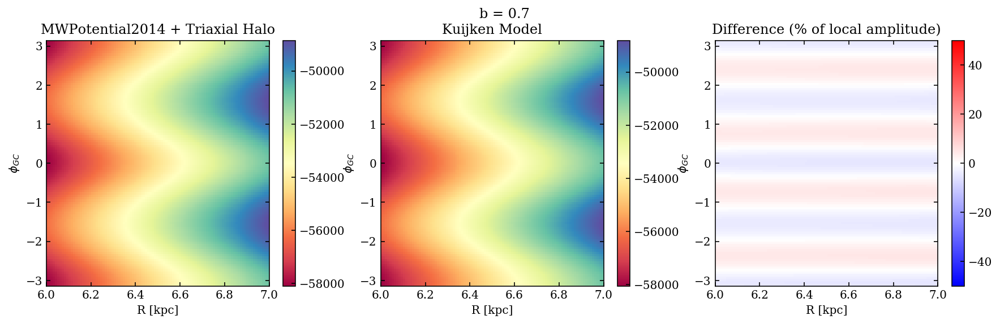

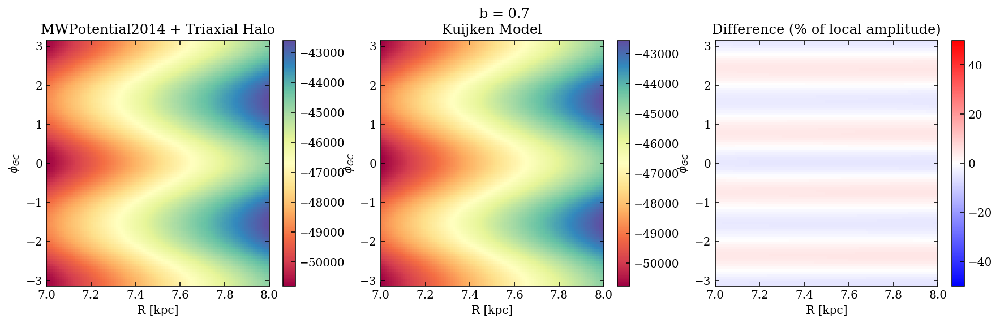

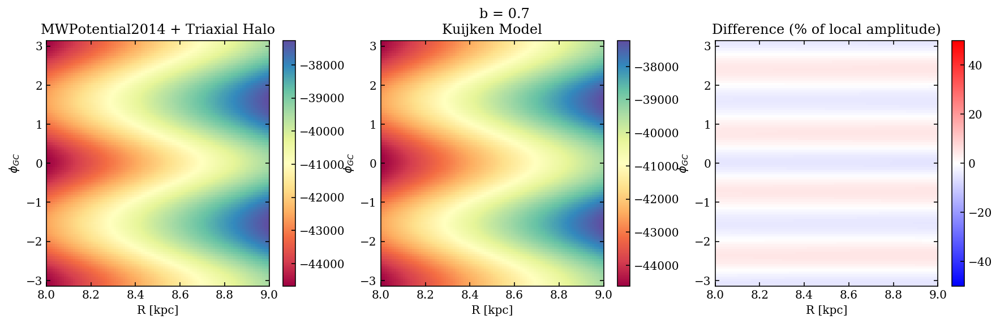

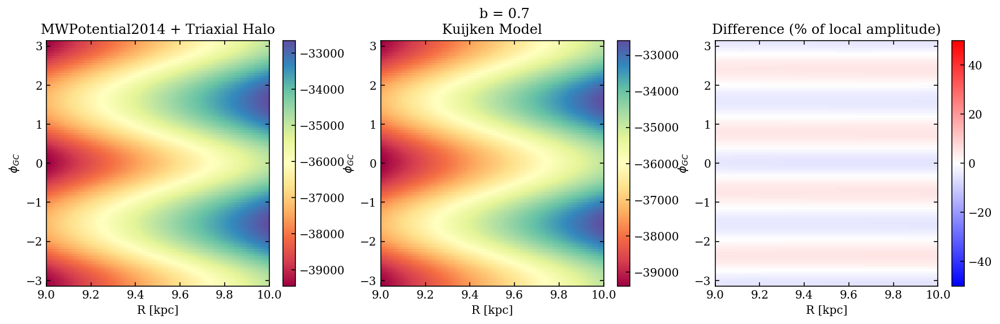

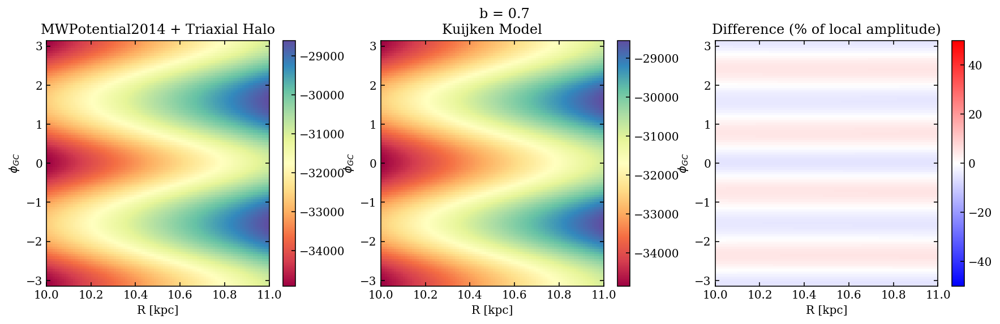

...

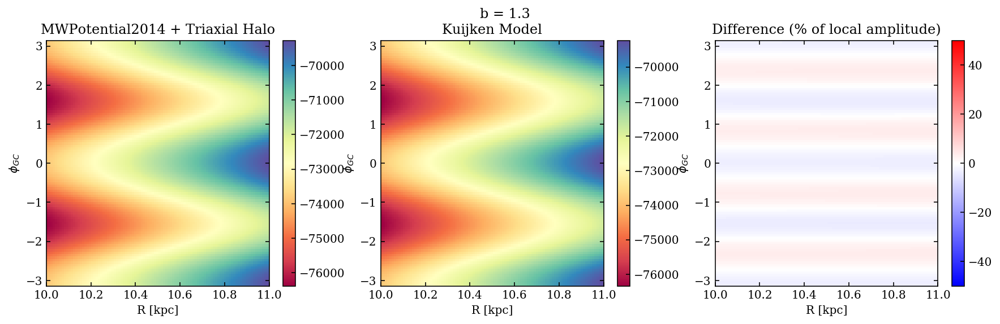

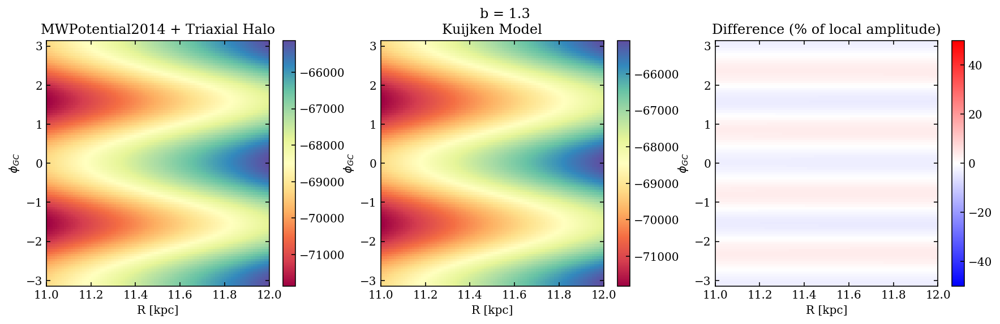

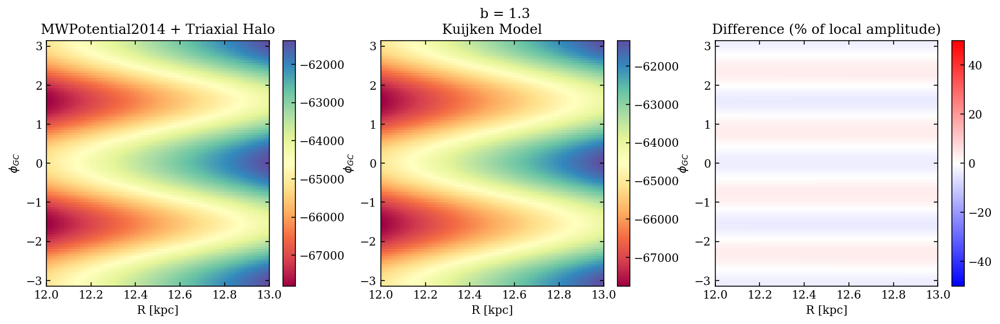

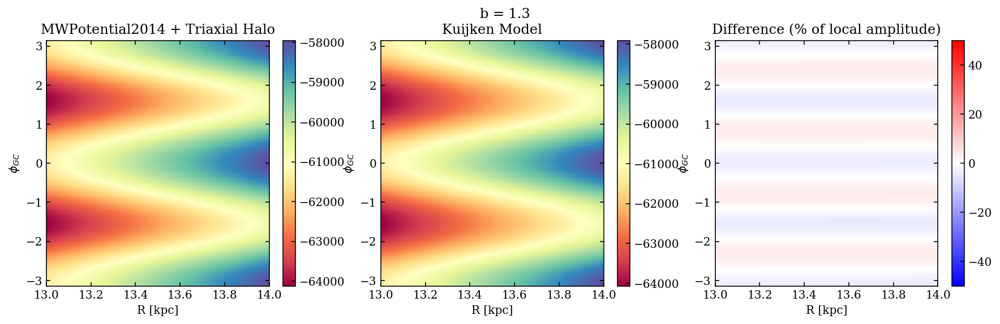

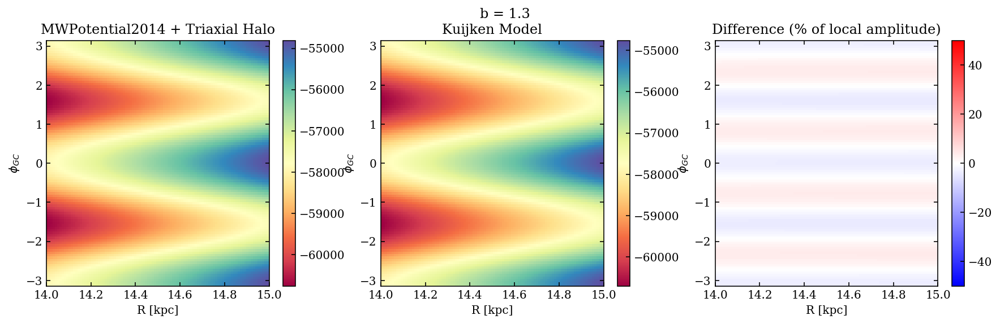

In [182]:
for i in range( n_bs ):
    
    # Make the potential
    mwpot_trihalo = ast1501.potential.make_MWPotential2014_triaxialNFW(halo_b=b_values[i])
    
    for j in range( n_Rs ):
        
        R_hi = R_bin_cents[j]+R_bin_size/2
        R_lo = R_bin_cents[j]-R_bin_size/2
        
        # Make the cutout radial range. Centered on the radial bin
        R_range = np.linspace( R_lo, R_hi, 100 )
        phi_range = np.linspace( phi_limits[0], phi_limits[1], 100 )
        R_mesh, phi_mesh = np.meshgrid( R_range, phi_range )
        mesh_size = R_mesh.shape

        # Make into a 2D array that can be fed into the function
        Rs = R_mesh.flatten()
        phis = phi_mesh.flatten()
        xdata = np.vstack((Rs,phis))
        
        # Make the galpy data
        pot = np.zeros_like(Rs)
        for k in range( len(pot) ):
            pot[k] = potential.evaluatePotentials( mwpot_trihalo, R=Rs[k]/8, z=0, phi=phis[k] ).value
        ###i
        pot_inf = potential.evaluatePotentials( mwpot_trihalo, R=100000, z=0, phi=0 ).value
        # pot -= pot_inf

        # Now fit
        popt, pcov = curve_fit(kuijken_model, xdata, pot, p0=[220,-0.1,0,0.4,220*220*1.3], maxfev=1000000 )

        # Store the output
        print(popt)
        variable_storage[i,j,:] = popt

        # Now plot
        fig = plt.figure( figsize=(15,4) )

        plt.subplot(1, 3, 1)
        plt.title("MWPotential2014 + Triaxial Halo")
        plt.pcolormesh(R_mesh, phi_mesh, pot.reshape(mesh_size), cmap='Spectral')
        plt.axis( [ R_lo, R_hi, phi_limits[0], phi_limits[1] ] )
        plt.xlabel('R [kpc]')
        plt.ylabel(r'$\phi_{GC}$')
        plt.colorbar()

        plt.subplot(1, 3, 2)
        plt.title("Kuijken Model")
        plt.pcolormesh( R_mesh, phi_mesh, kuijken_model(xdata, *popt).reshape(mesh_size), cmap='Spectral' )
        plt.axis( [ R_lo, R_hi, phi_limits[0], phi_limits[1] ] )
        plt.xlabel('R [kpc]')
        plt.ylabel(r'$\phi_{GC}$')
        plt.colorbar()

        plt.subplot(1, 3, 3)
        plt.title("Difference (% of local amplitude)")
        pot_Ravg_sub = pot.reshape(mesh_size) - np.mean( pot.reshape(mesh_size), 0 ) # Average of each R is subtracted
        pot_Ravg_sub_max = np.amax( pot_Ravg_sub, axis=0 )
        pot_Ravg_sub_max_grid = np.repeat( pot_Ravg_sub_max[:, np.newaxis], pot_Ravg_sub_max.shape[0], axis=1)
        plt.pcolormesh( R_mesh, phi_mesh, 
                       100*np.divide(pot.reshape(mesh_size) - kuijken_model(xdata, *popt).reshape(mesh_size),
                                     pot_Ravg_sub_max_grid), cmap='bwr', vmin=-50, vmax=50 
                      )
        plt.axis( [ R_lo, R_hi, phi_limits[0], phi_limits[1] ] )
        plt.xlabel('R [kpc]')
        plt.ylabel(r'$\phi_{GC}$')
        plt.colorbar()

        plt.suptitle('b = '+str(round(b_values[i],2)) )

        pass;
    ###j
###i

## Make a 2D double power law model

$
f(R,b;A_{1},A_{2},k_{1},k_{2},d) = A_{1}R^{k_{1}} + A_{2}b^{k_{2}} + d
$

In [183]:
def double_power_law_fit(x,A1,A2,k1,k2,d):
    return A1*(x[0]**k1) + A2*(x[1]**k2) + d
#def

def double_power_law(R,b,A1,A2,k1,k2,d):
    return A1*(R**k1) + A2*(b**k2) + d
#def

1 are for R
2 are for b
A1 = 0.0
A2 = 3127.6354
k1 = 3.7301
k2 = 0.0053
d = -2907.3604
[ 3.21370745e-06  3.12763544e+03  3.73010551e+00  5.33845763e-03
 -2.90736040e+03]


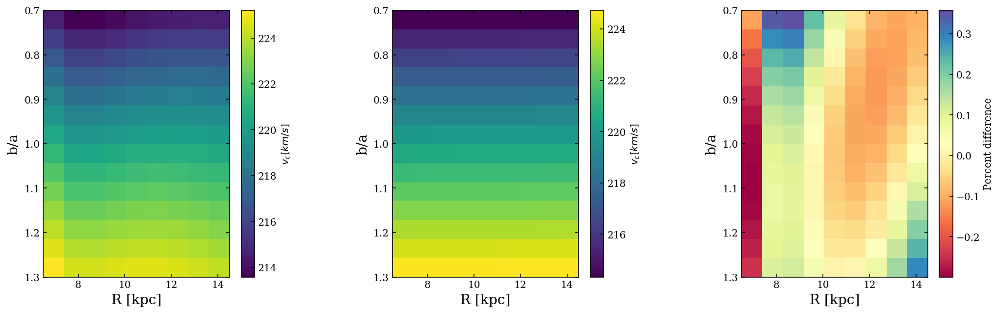

1 are for R
2 are for b
A1 = -149.9957
A2 = -0.4735
k1 = 0.0004
k2 = -0.2095
d = 150.5079
[-1.49995668e+02 -4.73462697e-01  4.25002531e-04 -2.09460141e-01
  1.50507890e+02]


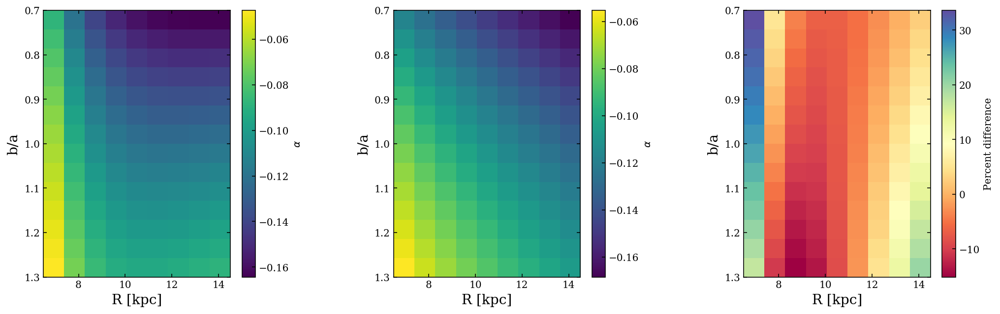

1 are for R
2 are for b
A1 = 0.391
A2 = 3104.7688
k1 = 0.1549
k2 = 1.2308
d = -3106.3924
[ 3.91029234e-01  3.10476882e+03  1.54903123e-01  1.23083799e+00
 -3.10639244e+03]


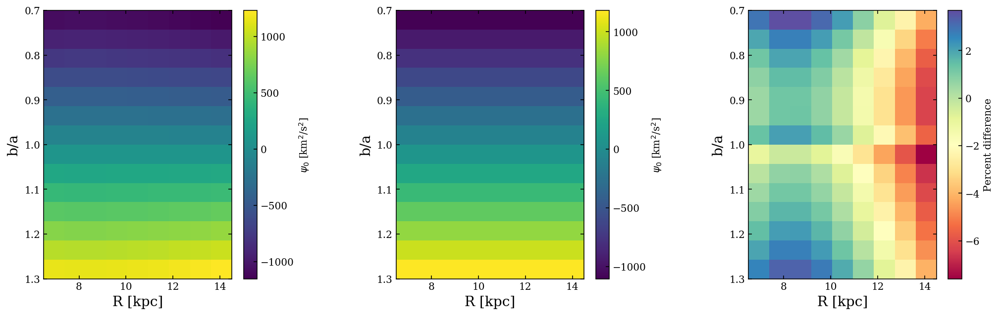

1 are for R
2 are for b
A1 = -0.6462
A2 = -3.1251
k1 = 0.3129
k2 = -0.0619
d = 4.8088
[-0.64619103 -3.12507048  0.31285063 -0.06194794  4.80883148]


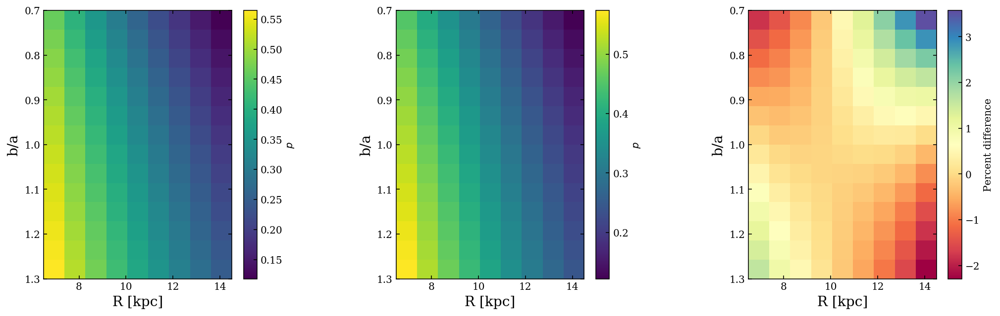

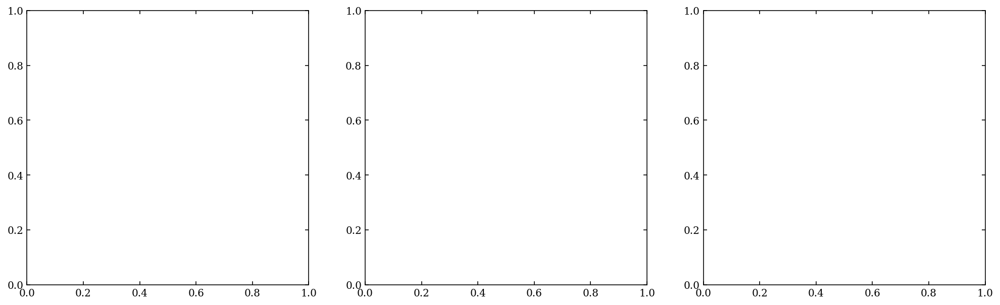

In [184]:
for i in range( n_variables ):
    
    fig = plt.figure( figsize=(17,5) )
    axs = fig.subplots( nrows=1, ncols=3 )
    
    # Now fit a simple power law
    if i < 4:
            
        R_bin_mesh, b_mesh = np.meshgrid(R_bin_cents, b_values)
        fit_mesh_size = R_bin_mesh.shape
        R_bins = R_bin_mesh.flatten()
        bs = b_mesh.flatten()
        fit_data = np.vstack((R_bins,bs))
        
        popt,pcov = curve_fit( double_power_law_fit, fit_data, variable_storage[:,:,i].flatten(), maxfev=10000 )
        fake_z = double_power_law(R_bin_mesh, b_mesh, *popt)
        
        img0 = axs[0].imshow(variable_storage[:,:,i], cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[0].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[0].set_ylabel( 'b/a', fontsize=14 )
        cbar0 = fig.colorbar(img0, ax=axs[0])
        cbar0.set_label( variable_names[i] )
        
        img1 = axs[1].imshow(fake_z, cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[1].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[1].set_ylabel( 'b/a', fontsize=14 )
        cbar1 = fig.colorbar(img1, ax=axs[1])
        cbar1.set_label( variable_names[i] )
        
        img2 = axs[2].imshow( 100*np.divide( fake_z-variable_storage[:,:,i], variable_storage[:,:,i] ) , 
                             cmap='Spectral', aspect='auto', 
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[2].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[2].set_ylabel( 'b/a', fontsize=14 )
        cbar2 = fig.colorbar(img2, ax=axs[2])
        cbar2.set_label( 'Percent difference' )
        
        fig.subplots_adjust(wspace=0.5)
        
        # Print the results
        print('1 are for R')
        print('2 are for b')
        print('A1 = '+str(round(popt[0],4)))
        print('A2 = '+str(round(popt[1],4)))
        print('k1 = '+str(round(popt[2],4)))
        print('k2 = '+str(round(popt[3],4)))
        print('d = '+str(round(popt[4],4)))
        print(popt)
        
    ##fi
    
    plt.show()
    plt.close('all')
###i

## Make a 2D quadratic model

$
f(R,b;A_{1},A_{2},A_{3},A_{4},d) = A_{1}R + A_{2}R^{2} + A_{3}b + A_{4}b^{2} + d
$

In [171]:
def double_quadratic_fit(x,A1,A2,A3,A4,d):
    return A1*x[0] + A2*x[0]**2 + A3*x[1] + A4*x[1]**2 + d
#def

def double_quadratic(R,b,A1,A2,A3,A4,d):
    return A1*R + A2*R**2 + A3*b + A4*b**2 + d
#def

def double_trinomial(R,)

A1 = -1.9745
A2 = 0.0891
A3 = 39.5932
A4 = -11.2977
d = 202.5602
[-1.97451439e+00  8.90887940e-02  3.95931885e+01 -1.12977261e+01
  2.02560214e+02]


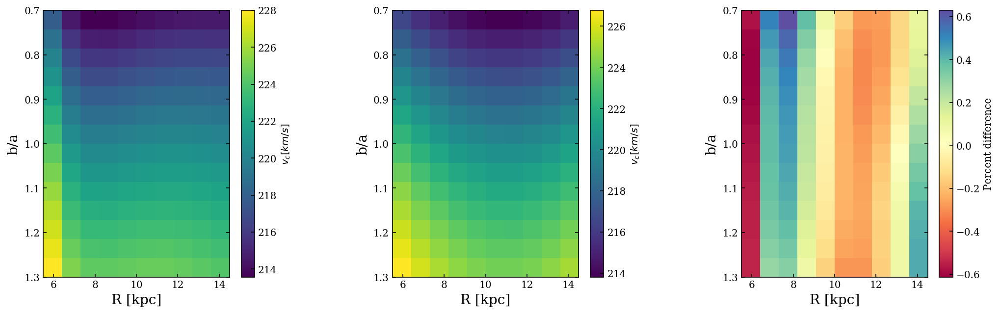

A1 = -0.0592
A2 = 0.0025
A3 = 0.2202
A4 = -0.0616
d = 0.0637
[-0.05921654  0.0024933   0.22021759 -0.06156605  0.06368245]


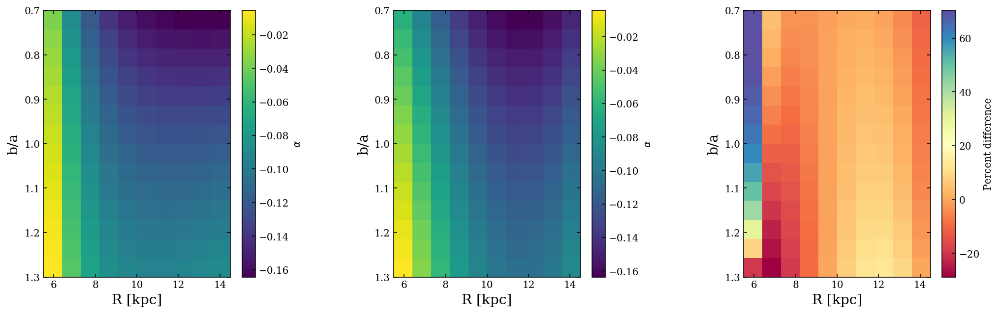

A1 = 0.1207
A2 = -0.0047
A3 = 2934.9369
A4 = 439.2343
d = -3375.7907
[ 1.20744245e-01 -4.73265816e-03  2.93493695e+03  4.39234287e+02
 -3.37579067e+03]


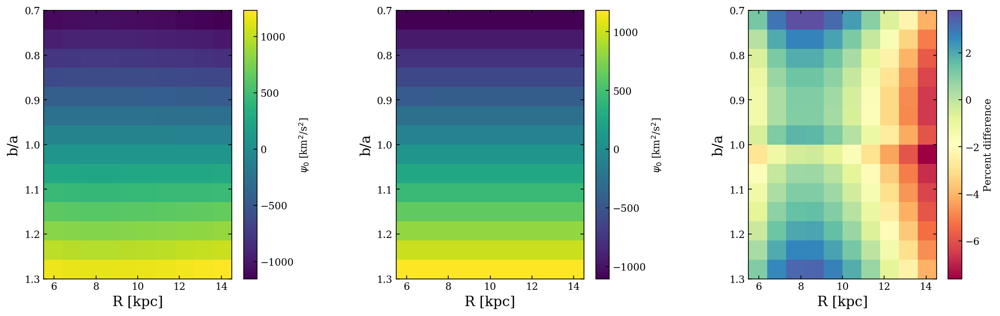

A1 = -0.0726
A2 = 0.0015
A3 = 0.4092
A4 = -0.1076
d = 0.6302
[-0.07255157  0.00149351  0.40920891 -0.10761897  0.6302341 ]


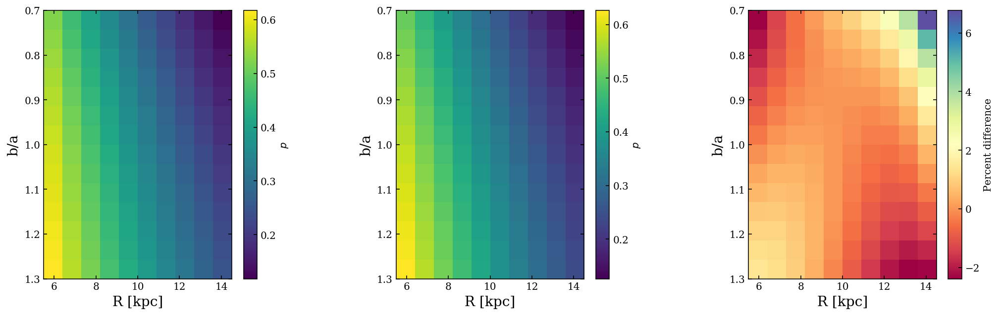

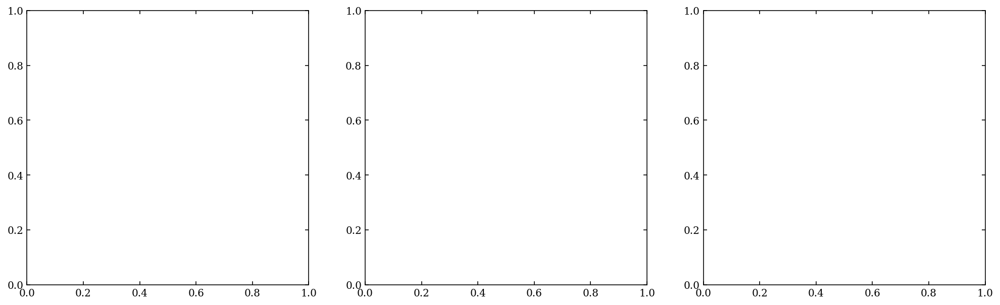

In [172]:
for i in range( n_variables ):
    
    fig = plt.figure( figsize=(17,5) )
    axs = fig.subplots( nrows=1, ncols=3 )
    
    # Now fit a simple power law
    if i < 4:
            
        R_bin_mesh, b_mesh = np.meshgrid(R_bin_cents, b_values)
        fit_mesh_size = R_bin_mesh.shape
        R_bins = R_bin_mesh.flatten()
        bs = b_mesh.flatten()
        fit_data = np.vstack((R_bins,bs))
        
        popt,pcov = curve_fit( double_quadratic_fit, fit_data, variable_storage[:,:,i].flatten(), maxfev=10000 )
        fake_z = double_quadratic(R_bin_mesh, b_mesh, *popt)
        
        img0 = axs[0].imshow(variable_storage[:,:,i], cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[0].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[0].set_ylabel( 'b/a', fontsize=14 )
        cbar0 = fig.colorbar(img0, ax=axs[0])
        cbar0.set_label( variable_names[i] )
        
        img1 = axs[1].imshow(fake_z, cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[1].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[1].set_ylabel( 'b/a', fontsize=14 )
        cbar1 = fig.colorbar(img1, ax=axs[1])
        cbar1.set_label( variable_names[i] )
        
        img2 = axs[2].imshow( 100*np.divide( fake_z-variable_storage[:,:,i], variable_storage[:,:,i] ) , 
                             cmap='Spectral', aspect='auto', 
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[2].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[2].set_ylabel( 'b/a', fontsize=14 )
        cbar2 = fig.colorbar(img2, ax=axs[2])
        cbar2.set_label( 'Percent difference' )
        
        fig.subplots_adjust(wspace=0.5)
        
        # Print the results
        print('A1 = '+str(round(popt[0],4)))
        print('A2 = '+str(round(popt[1],4)))
        print('A3 = '+str(round(popt[2],4)))
        print('A4 = '+str(round(popt[3],4)))
        print('d = '+str(round(popt[4],4)))
        print(popt)
        
    ##fi
    
    plt.show()
    plt.close('all')
###i